In [ ]:
!pip install tensorflow
!pip install gpflow==2.9.1

import numpy as np
import gpflow
from scipy.stats import norm
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter, MaxNLocator

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.6/380.6 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.8/45.8 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.7/111.7 kB 8.8 MB/s eta 0:00:00


In [ ]:
import numpy as np
import itertools

**1D IMPLEMENTATION**

In [ ]:
def generate_noisy_data(x, n_points=5, noise_std_range=(0.0, 5)):
    X_noisy = []
    y_noisy = []
    noise_levels = []

    for point in x:
        noise_level = np.random.uniform(noise_std_range[0], noise_std_range[1])
        for _ in range(n_points):
            noisy_y = calculate_y(np.array([[point]])) + np.random.normal(0, noise_level)
            X_noisy.append(point)
            y_noisy.append(noisy_y)
            noise_levels.append(noise_level)

    X_noisy = np.array(X_noisy).reshape(-1, 1)
    y_noisy = np.array(y_noisy).reshape(-1, 1)
    noise_levels = np.array(noise_levels)

    return X_noisy, y_noisy, noise_levels

In [ ]:
# DEFINE HETEROSKEDASTIC GP MODEL + TRAINING
def train_noise_model(X, y):
    kernel = gpflow.kernels.Matern32(lengthscales=0.01)
    noise_model = gpflow.models.GPR(data=(X, y), kernel=kernel, mean_function=None)
    opt = gpflow.optimizers.Scipy()
    opt.minimize(noise_model.training_loss, noise_model.trainable_variables)
    return noise_model

def train_heteroskedastic_gp_model(X, y, noise_variance):
    kernel = gpflow.kernels.SquaredExponential(lengthscales=0.1)
    heteroskedastic_gp_model = gpflow.models.GPR(data=(X, y), kernel=kernel, mean_function=None)
    # Use the mean noise variance instead of per-data-point variance
    heteroskedastic_gp_model.likelihood.variance.assign(1e-5)
    opt = gpflow.optimizers.Scipy()
    opt.minimize(heteroskedastic_gp_model.training_loss, heteroskedastic_gp_model.trainable_variables)
    return heteroskedastic_gp_model

# Expected Improvement function for minimization
def expected_improvement(y_best, f_mean, f_var):
    variance = np.maximum(f_var, 1e-9)  # Ensure variance is non-negative
    std_dev = np.sqrt(variance)
    delta = y_best - f_mean
    with np.errstate(divide='ignore'):
        Z = delta / std_dev
        ei = delta * norm.cdf(Z) + std_dev * norm.pdf(Z)  # Correctly adjusted for minimization
        ei[std_dev == 0.0] = 0.0
    return ei

In [ ]:
gp_var = 1
# Function to generate a grid of points for prediction
def generate_grid(x_limits, num_points=100):
    grid = np.linspace(x_limits[0], x_limits[1], num_points)
    return grid.reshape(-1, 1)

# Function to calculate y based on the Forrester function
def calculate_y(x):
    term1 = (6 * x - 2) ** 2 * np.sin(12 * x - 4) + np.random.normal(0, np.sqrt(gp_var), x.shape)
    return term1

def calculate_y_true(x):
    term2 = (6 * x - 2) ** 2 * np.sin(12 * x - 4)
    return term2

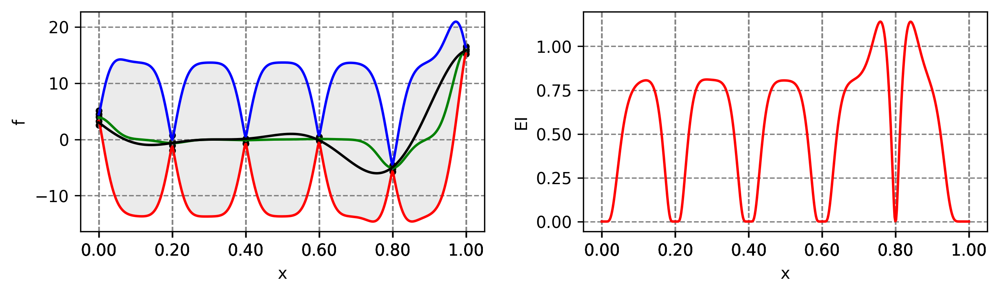

Top EI Point:
x: [0.75951904]
Predicted y at EI point: [-2.76333654]
EI at this point: [1.14076827]

Top LCB Point:
x: [0.74749499]
Predicted y at LCB point: [-1.82636879]
LCB at this point: [-14.61224873]


In [ ]:
# MAIN SCRIPT
x_limits = [0., 1.]

# Define the levels for x
x_manual = np.array([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])

# Generate multiple noisy observations for each original point
X, y, noise_levels = generate_noisy_data(x_manual, n_points=5)

# Train noise model
noise_model = train_noise_model(X, y)
pred_noise_var, _ = noise_model.predict_f(X)
pred_noise_var = pred_noise_var.numpy()

# Train heteroskedastic GP model
heteroskedastic_gp_model = train_heteroskedastic_gp_model(X, y, pred_noise_var)

# Generate grid for prediction
X_plot = generate_grid(x_limits, 500)

# Predict f_mean and f_var for the model
f_mean, f_var = heteroskedastic_gp_model.predict_f(X_plot)
f_mean = f_mean.numpy()
f_var = f_var.numpy()

# Calculate true y values for comparison
y_true = calculate_y_true(X_plot)

# Calculate LCB and UCB for plotting
LCB = f_mean - 1.96 * np.sqrt(f_var)
UCB = f_mean + 1.96 * np.sqrt(f_var)

# y_best = minimum value of y
y_best = np.min(y)

# Calculate EI
ei = expected_improvement(y_best, f_mean, f_var)

# Find the point that maximizes EI
max_ei_index = np.argmax(ei)
x_max_ei = X_plot[max_ei_index]
y_max_ei_predicted = f_mean[max_ei_index]

# Find the point with the lowest LCB
min_lcb_index = np.argmin(LCB)
x_min_lcb = X_plot[min_lcb_index]
y_min_lcb_predicted = f_mean[min_lcb_index]

# Plotting
fontsize = 10
linewidth = 1.5

# Plot preparation
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 3), dpi=300)
fig.tight_layout(pad=3.0)

# Plot f_mean, LCB, UCB, and scatter observed points
ax1.fill_between(X_plot.flatten(), LCB.flatten(), UCB.flatten(), color='silver', alpha=0.3)
ax1.plot(X_plot, f_mean, color="green", linestyle='-', linewidth=linewidth, label='Mean')
ax1.plot(X_plot, LCB, color="red", linestyle='-', linewidth=linewidth, label='LCB')
ax1.plot(X_plot, UCB, color="blue", linestyle='-', linewidth=linewidth, label='UCB')
ax1.plot(X_plot, y_true, color="black", linestyle='-',linewidth=linewidth, label='y_true' )
ax1.set_xticks(X.flatten())
ax1.tick_params(axis='x', labelsize=fontsize)
ax1.tick_params(axis='y', labelsize=fontsize)
ax1.set_xlabel("x", fontsize=fontsize)
ax1.set_ylabel("f", fontsize=fontsize)
ax1.grid(True, which='major', color='gray', linestyle='--')
ax1.scatter(X, y, color="black", s=10, label='Observed Points')
ax1.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x:.2f}"))


# Plot EI
ax2.plot(X_plot, ei, color="red", linewidth=linewidth, label='EI')
ax2.set_xlabel("x", fontsize=fontsize)
ax2.set_ylabel("EI", fontsize=fontsize)
ax2.set_xticks(X.flatten())
ax2.tick_params(axis='x', labelsize=fontsize)
ax2.tick_params(axis='y', labelsize=fontsize)
ax2.set_xlabel("x", fontsize=fontsize)
ax2.set_ylabel("EI", fontsize=fontsize)
ax2.grid(True, which='major', color='gray', linestyle='--')
ax2.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x:.2f}"))

plt.show()

# Print points
print("Top EI Point:")
print("x:", x_max_ei)
print("Predicted y at EI point:", y_max_ei_predicted)
print("EI at this point:", ei[max_ei_index])

print("\nTop LCB Point:")
print("x:", x_min_lcb)
print("Predicted y at LCB point:", y_min_lcb_predicted)
print("LCB at this point:", LCB[min_lcb_index])


**2D IMPLEMENTATION MAYBE**

In [ ]:
import numpy as np
import gpflow
from scipy.stats import norm
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Function to generate noisy data for two inputs and two outputs
def generate_noisy_data(x1, x2, n_points=5, noise_std_range=(0.1, 5)):
    X_noisy = []
    y1_noisy = []
    y2_noisy = []
    noise_levels = []

    for point1, point2 in zip(x1, x2):
        noise_level = np.random.uniform(noise_std_range[0], noise_std_range[1])
        for _ in range(n_points):
            noisy_y1 = calculate_y1(np.array([[point1, point2]])) + np.random.normal(0, noise_level)
            noisy_y2 = calculate_y2(np.array([[point1, point2]])) + np.random.normal(0, noise_level)
            X_noisy.append([point1, point2])
            y1_noisy.append(noisy_y1)
            y2_noisy.append(noisy_y2)
            noise_levels.append(noise_level)

    X_noisy = np.array(X_noisy)
    y1_noisy = np.array(y1_noisy).reshape(-1, 1)
    y2_noisy = np.array(y2_noisy).reshape(-1, 1)
    noise_levels = np.array(noise_levels)

    return X_noisy, y1_noisy, y2_noisy, noise_levels

# Function to calculate Y based on the three-hump camel function (Y1)
def calculate_y1(X):
    X1, X2 = X[:, 0], X[:, 1]  # Extract X1 and X2 from the input array
    term1 = 2 * X1 ** 2
    term2 = -1.05 * X1 ** 4
    term3 = X1 ** 6 / 6
    term4 = X1 * X2
    term5 = X2 ** 2
    return term1 + term2 + term3 + term4 + term5

# Function to calculate Y based on the three-hump camel function (Y2)
def calculate_y2(X):
    X1, X2 = X[:, 0], X[:, 1]  # Extract X1 and X2 from the input array
    term1 = 2 * X1 ** 2
    term2 = -1.05 * X1 ** 4
    term3 = X1 ** 6 / 6
    term4 = X1 * X2
    term5 = X2 ** 2
    return term1 + term2 + term3 + term4 + term5

# Train noise model
def train_noise_model(X, y):
    kernel = gpflow.kernels.Matern32(lengthscales=0.05)
    noise_model = gpflow.models.GPR(data=(X, y), kernel=kernel, mean_function=None)
    gpflow.utilities.set_trainable(model.likelihood.variance, False)
    opt = gpflow.optimizers.Scipy()
    opt.minimize(noise_model.training_loss, noise_model.trainable_variables)
    return noise_model

def train_heteroskedastic_gp_model(X, y, noise_variance):
    kernel = gpflow.kernels.SquaredExponential(lengthscales=0.3)
    heteroskedastic_gp_model = gpflow.models.GPR(data=(X, y), kernel=kernel, mean_function=None)
    heteroskedastic_gp_model.likelihood.variance.assign(1e-5)
    opt = gpflow.optimizers.Scipy()
    opt.minimize(heteroskedastic_gp_model.training_loss, heteroskedastic_gp_model.trainable_variables)
    return heteroskedastic_gp_model


# Expected Improvement function for minimization
def expected_improvement(y_best, f_mean, f_var):
    variance = np.maximum(f_var, 1e-9)  # Ensure variance is non-negative
    std_dev = np.sqrt(variance)
    delta = y_best - f_mean
    Z = delta / std_dev
    ei = delta * norm.cdf(Z) + std_dev * norm.pdf(Z)  # Correctly adjusted for minimization
    ei = np.where(std_dev == 0.0, 0.0, ei) # Use np.where to handle the edge case
    return ei

# Generate grid for prediction
X_plot = generate_grid(x1_limits, x2_limits)

# Generate grid for prediction
def generate_grid(x1_limits, x2_limits, num_points=100):
    x1_grid, x2_grid = np.meshgrid(
        np.linspace(x1_limits[0], x1_limits[1], num_points),
        np.linspace(x2_limits[0], x2_limits[1], num_points)
    )
    return np.hstack([x1_grid.reshape(-1, 1), x2_grid.reshape(-1, 1)]) # Return a single array

# MAIN SCRIPT
x1_limits = [-2, 2] # Modified
x2_limits = [-2, 2] # Modified

# Define the levels for x1 and x2
x1_manual = np.array([-1.5, 0.6, 1.0, 2.0])
x2_manual = np.array([-1.5, 0.6, 1.0, 2.0])

# Generate multiple noisy observations for each original point
X, y1, y2, noise_levels = generate_noisy_data(x1_manual, x2_manual, n_points=5)

# Train noise models for y1 and y2
noise_model_y1 = train_noise_model(X, y1)
noise_model_y2 = train_noise_model(X, y2)

# Predict noise variance
pred_noise_var_y1, _ = noise_model_y1.predict_f(X)
pred_noise_var_y2, _ = noise_model_y2.predict_f(X)

# Train heteroskedastic GP models for y1 and y2
heteroskedastic_gp_model_y1 = train_heteroskedastic_gp_model(X, y1, pred_noise_var_y1.numpy())
heteroskedastic_gp_model_y2 = train_heteroskedastic_gp_model(X, y2, pred_noise_var_y2.numpy())

# Predict f_mean and f_var for y1 and y2
f1_mean, f1_var = heteroskedastic_gp_model_y1.predict_f(X_plot)
f2_mean, f2_var = heteroskedastic_gp_model_y2.predict_f(X_plot)

# Calculate LCB and UCB for f1 and f2
LCB_f1 = f1_mean - 1.96 * np.sqrt(f1_var)
UCB_f1 = f1_mean + 1.96 * np.sqrt(f1_var)
LCB_f2 = f2_mean - 1.96 * np.sqrt(f2_var)
UCB_f2 = f2_mean + 1.96 * np.sqrt(f2_var)

# Calculate EI for f1 and f2
y1_best = np.min(y1)
y2_best = np.min(y2)
ei_f1 = expected_improvement(y1_best, f1_mean, f1_var)
ei_f2 = expected_improvement(y2_best, f2_mean, f2_var)

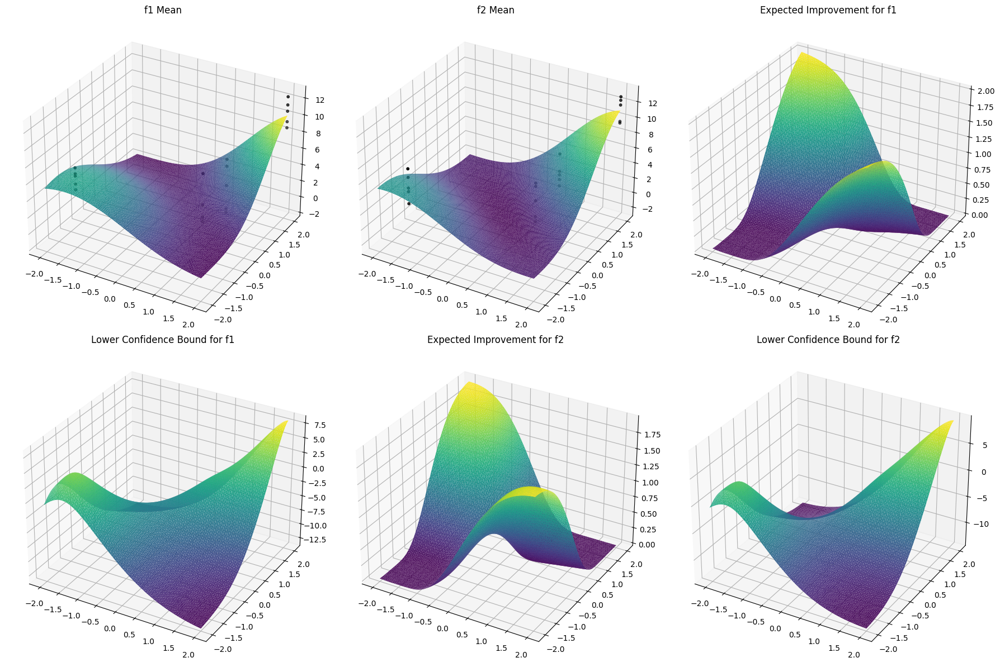

In [ ]:
# Convert to numpy and flatten
f1_mean_np = f1_mean.numpy().flatten()
f2_mean_np = f2_mean.numpy().flatten()
LCB_f1_np = (f1_mean - 1.96 * np.sqrt(f1_var)).numpy().flatten()
LCB_f2_np = (f2_mean - 1.96 * np.sqrt(f2_var)).numpy().flatten()

# Calculate EI and flatten directly, as 'expected_improvement' already returns a NumPy array
ei_f1_np = expected_improvement(np.min(y1), f1_mean_np, f1_var.numpy().flatten())
ei_f2_np = expected_improvement(np.min(y2), f2_mean_np, f2_var.numpy().flatten())

# Plot the mean, EI, and LCB for f1 and f2 as surface plots
fig = plt.figure(figsize=(18, 12))

# Plot f1_mean
ax1 = fig.add_subplot(231, projection='3d')
ax1.plot_trisurf(X_plot[:, 0], X_plot[:, 1], f1_mean_np, cmap='viridis')
ax1.scatter(X[:, 0], X[:, 1], y1, color="black", s=10, label='Observed Points')
ax1.set_title("f1 Mean")

# Plot f2_mean
ax4 = fig.add_subplot(232, projection='3d')
ax4.scatter(X[:, 0], X[:, 1], y2, color="black", s=10, label='Observed Points')
ax4.plot_trisurf(X_plot[:, 0], X_plot[:, 1], f2_mean_np, cmap='viridis')
ax4.set_title("f2 Mean")

# Plot EI for f1
ax2 = fig.add_subplot(233, projection='3d')
ax2.plot_trisurf(X_plot[:, 0], X_plot[:, 1], ei_f1_np, cmap='viridis')
ax2.set_title("Expected Improvement for f1")

# Plot LCB for f1
ax3 = fig.add_subplot(234, projection='3d')
ax3.plot_trisurf(X_plot[:, 0], X_plot[:, 1], LCB_f1_np, cmap='viridis')
ax3.set_title("Lower Confidence Bound for f1")

# Plot EI for f2
ax5 = fig.add_subplot(235, projection='3d')
ax5.plot_trisurf(X_plot[:, 0], X_plot[:, 1], ei_f2_np, cmap='viridis')
ax5.set_title("Expected Improvement for f2")

# Plot LCB for f2
ax6 = fig.add_subplot(236, projection='3d')
ax6.plot_trisurf(X_plot[:, 0], X_plot[:, 1], LCB_f2_np, cmap='viridis')
ax6.set_title("Lower Confidence Bound for f2")

plt.tight_layout()
plt.show()

Vanilla vs. HGP Mean Predictions:

In [ ]:
# Predict f_mean and f_var for y1 and y2 using Heteroskedastic GP
f_mean_y1_hetero, _ = heteroskedastic_gp_model_y1.predict_f(X_plot)
f_mean_y2_hetero, _ = heteroskedastic_gp_model_y2.predict_f(X_plot)

# Train vanilla GP models for y1 and y2 (using the same kernel as noise model for simplicity)
vanilla_gp_model_y1 = train_noise_model(X, y1)
vanilla_gp_model_y2 = train_noise_model(X, y2)

# Predict f_mean for y1 and y2 using Vanilla GP
f_mean_y1_vanilla, _ = vanilla_gp_model_y1.predict_f(X_plot)
f_mean_y2_vanilla, _ = vanilla_gp_model_y2.predict_f(X_plot)

# Reshape the mean predictions for plotting
f_mean_y1_vanilla = f_mean_y1_vanilla.numpy().reshape(x1_grid.shape)
f_mean_y1_hetero = f_mean_y1_hetero.numpy().reshape(x1_grid.shape)
f_mean_y2_vanilla = f_mean_y2_vanilla.numpy().reshape(x1_grid.shape)
f_mean_y2_hetero = f_mean_y2_hetero.numpy().reshape(x1_grid.shape)

# Plot comparison for y1 as surfaces
fig = plt.figure(figsize=(15, 7), dpi=800)

# Vanilla GP for y1
ax1 = fig.add_subplot(121, projection='3d')
ax1.plot_surface(x1_grid, x2_grid, f_mean_y1_vanilla, cmap='coolwarm', edgecolor='none')
ax1.scatter(X[:, 0], X[:, 1], y1, color='white', edgecolor='black')
ax1.set_title("Vanilla GP - y1", fontsize=20)
ax1.set_xlabel('X1', fontsize=15)
ax1.set_ylabel('X2', fontsize=15)
ax1.set_zlabel('f1 Mean', fontsize=15)

# Heteroskedastic GP for y1
ax2 = fig.add_subplot(122, projection='3d')
ax2.plot_surface(x1_grid, x2_grid, f_mean_y1_hetero, cmap='coolwarm', edgecolor='none')
ax2.scatter(X[:, 0], X[:, 1], y1, color='white', edgecolor='black')
ax2.set_title("Heteroskedastic GP - y1", fontsize=20)
ax2.set_xlabel('X1', fontsize=15)
ax2.set_ylabel('X2', fontsize=15)
ax2.set_zlabel('f1 Mean', fontsize=15)

plt.tight_layout()
plt.show()

# Plot comparison for y2 as surfaces
fig = plt.figure(figsize=(15, 7), dpi=800)

# Vanilla GP for y2
ax1 = fig.add_subplot(121, projection='3d')
ax1.plot_surface(x1_grid, x2_grid, f_mean_y2_vanilla, cmap='coolwarm', edgecolor='none')
ax1.scatter(X[:, 0], X[:, 1], y2, color='white', edgecolor='black')
ax1.set_title("Vanilla GP - y2", fontsize=20)
ax1.set_xlabel('X1', fontsize=15)
ax1.set_ylabel('X2', fontsize=15)
ax1.set_zlabel('f2 Mean', fontsize=15)

# Heteroskedastic GP for y2
ax2 = fig.add_subplot(122, projection='3d')
ax2.plot_surface(x1_grid, x2_grid, f_mean_y2_hetero, cmap='coolwarm', edgecolor='none')
ax2.scatter(X[:, 0], X[:, 1], y2, color='white', edgecolor='black')
ax2.set_title("Heteroskedastic GP - y2", fontsize=20)
ax2.set_xlabel('X1', fontsize=15)
ax2.set_ylabel('X2', fontsize=15)
ax2.set_zlabel('f2 Mean', fontsize=15)

plt.tight_layout()
plt.show()

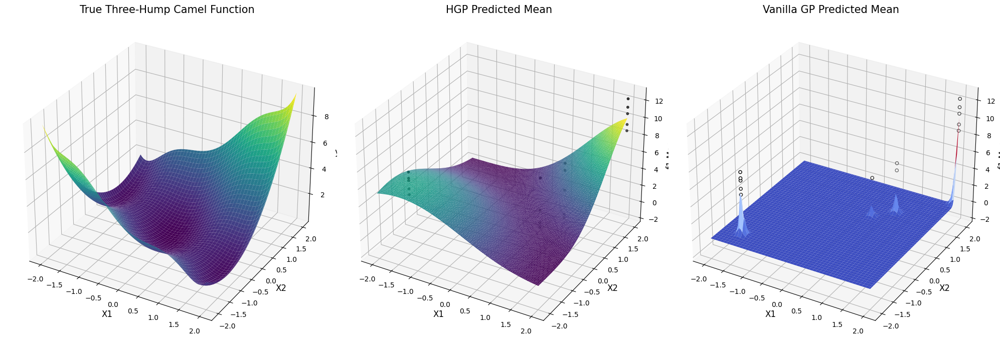

In [ ]:

# Create a figure for the combined plots
fig = plt.figure(figsize=(20, 7))

# Plot Y1 (three-hump camel function without noise) on the first axis
ax1 = fig.add_subplot(131, projection='3d')
ax1.plot_surface(x1_grid, x2_grid, y1_no_noise, cmap='viridis', edgecolor='none')
ax1.set_title("True Three-Hump Camel Function", fontsize=15)
ax1.set_xlabel('X1', fontsize=12)
ax1.set_ylabel('X2', fontsize=12)
ax1.set_zlabel('y1', fontsize=12)

# Plot f1_mean with observed points on the second axis
ax2 = fig.add_subplot(132, projection='3d')
ax2.plot_trisurf(X_plot[:, 0], X_plot[:, 1], f1_mean_np, cmap='viridis')
ax2.scatter(X[:, 0], X[:, 1], y1, color="black", s=10, label='Observed Points')
ax2.set_title("HGP Predicted Mean", fontsize=15)
ax2.set_xlabel('X1', fontsize=12)
ax2.set_ylabel('X2', fontsize=12)
ax2.set_zlabel('f1 Mean', fontsize=12)

# Plot the vanilla GP predictions for y1 on the third axis
ax3 = fig.add_subplot(133, projection='3d')
ax3.plot_surface(x1_grid, x2_grid, f_mean_y1_vanilla, cmap='coolwarm', edgecolor='none')
ax3.scatter(X[:, 0], X[:, 1], y1, color='white', edgecolor='black')
ax3.set_title("Vanilla GP Predicted Mean", fontsize=15)
ax3.set_xlabel('X1', fontsize=12)
ax3.set_ylabel('X2', fontsize=12)
ax3.set_zlabel('f1 Mean', fontsize=12)

plt.tight_layout()
plt.show()
